# Tutorial 2: Visium HD: Human Lymph Node

 <div style="margin:0; line-height:1.2">

 Analyze Human Lymph Node Spatial Transcriptomics data with SpacGPA.<br/>



 Data source: https://www.10xgenomics.com/cn/datasets/visium-hd-cytassist-gene-expression-libraries-human-lymph-node-v4  <br/>



 This is a human lymph node sample generated with Visium HD.<br/>

 <div>

In [1]:
# Import SpacGPA and other required packages.
import SpacGPA as sg
import scanpy as sc
import matplotlib.pyplot as plt
import pandas as pd
import os


In [2]:
# Set the working directory to your local path.
workdir = '..'
os.chdir(workdir)


 ### Part 1: Gene program analysis via SpacGPA ####

In [3]:
# For Visium HD data, we recommend using the binned outputs (e.g. 16μm binning here) for analysis.
# Before first-time use, construct the tissue_positions.csv from the tissue_positions.parquet file for easy reading.
# A demo for file conversion:
df_tissue_positions = pd.read_parquet("data/visium_HD/Human_Lymph_Node/binned_outputs/square_016um/spatial/tissue_positions.parquet")
df_tissue_positions.to_csv("data/visium_HD/Human_Lymph_Node/binned_outputs/square_016um/spatial/tissue_position.csv", index = False, header = None)
df_tissue_positions.to_csv("data/visium_HD/Human_Lymph_Node/binned_outputs/square_016um/spatial/tissue_positions_list.csv", index = False, header = None)


In [4]:
# Load spatial transcriptomics data.
adata = sc.read_visium("data/visium_HD/Human_Lymph_Node/binned_outputs/square_016um/",
                       count_file = "filtered_feature_bc_matrix.h5")
adata.var_names_make_unique()
adata.var_names = adata.var['gene_ids']
print(adata)
sc.pp.filter_cells(adata, min_genes = 1)
print(adata.X.shape)


AnnData object with n_obs × n_vars = 90566 × 18132
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'
(87688, 18132)


In [5]:
# Preprocessing: library-size normalize and log1p-transform.
sc.pp.normalize_total(adata, target_sum = 1e4)
sc.pp.log1p(adata)
sc.pp.filter_cells(adata, min_genes = 200)
sc.pp.filter_genes(adata, min_cells = 10)
print(adata.X.shape)


(35909, 18038)


In [6]:
# Construct the co-expression network using SpacGPA (Gaussian graphical model).
ggm = sg.create_ggm(adata, project_name = "Human Lymph Node")


Please Normalize The Expression Matrix Before Running!
Loading Data.

Running all calculations on GPU (if available).
Using single precision (float32) for all calculations.
Using chunk size of 5000 for efficient computation

Computing the number of cells co-expressing each gene pair...
Computing covariance matrix...
Computing Pearson correlation matrix...

Calculating partial correlations in 8135 iterations.
Number of genes randomly selected in each iteration: 2000
Iteration: 8135/8135, Avg loop time: 0.0384 s, Elapsed time: 5.24 min, Estimated time left: 0.00 min.                  
All iterations completed.

Performing FDR control...
Randomly redistribute the expression distribution of input genes...

Calculate correlation between genes after redistribution...

Computing the number of cells co-expressing each gene pair...
Computing covariance matrix...
Computing Pearson correlation matrix...

Calculating partial correlations in 8135 iterations.
Number of genes randomly selected in eac

In [7]:
# Show statistically significant co-expression gene pairs.
print(ggm.SigEdges.head(5))


             GeneA            GeneB      Pcor  SamplingTime         r  \
0  ENSG00000179403  ENSG00000235098  0.042871           102  0.110637   
1  ENSG00000142798  ENSG00000179403  0.029332           104  0.087998   
2  ENSG00000159189  ENSG00000173372  0.083552            98  0.136258   
3  ENSG00000173369  ENSG00000173372  0.050613            86  0.089195   
4  ENSG00000173369  ENSG00000159189  0.066142            97  0.113274   

   Cell_num_A  Cell_num_B  Cell_num_coexpressed           Project  
0        1002         764                   111  Human Lymph Node  
1         624        1002                    84  Human Lymph Node  
2        2763        2050                   449  Human Lymph Node  
3        1356        2050                   216  Human Lymph Node  
4        1356        2763                   308  Human Lymph Node  


In [8]:
# For first-time use SpacGPA on a new species, download the GO annotations via sg.get_go_annotations.
# Which will also provide the ENSEMBL to gene symbol mapping file.
sg.get_GO_annoinfo(species_name = 'human')



[MyGene] Building ALL-genes Ensembl→symbol table for species='human' ...
Fetching 82804 gene(s) . . .
No more results to return.
[MyGene] Build Ensembl→symbol mapping file for species='human' successfully

Querying MyGene.info for human genes with GO annotations ...
Total genes with GO annotation (reported): 20835

Fetching all genes with GO annotation ...
Fetching 20835 gene(s) . . .
No more results to return.
[MyGene] Saved GO annotation file for species='human' successfully


In [9]:
# Identify gene programs using the MCL-Hub algorithm (set inflation to 2).
ggm.find_modules(method = 'mcl-hub', inflation = 2, convert_to_symbols = True, species = 'human')
# the parameter 'convert_to_symbols' provides gene symbols in the output programs for better interpretability.



Find modules using MCL-Hub...
Current Pcor: 0.027
Total significantly co-expressed gene pairs: 7749
Iteration: 31, Max change: 0.00000000 
Converged at iteration 31.

2 modules were removed due to their linear or radial topology structure out of 28 modules.

Converting Ensembl IDs to gene symbols...


In [10]:
# Inspect the top 5 identified gene programs.
print(ggm.modules_summary.head(5))


  module_id  size  num_genes_degree_ge_2  \
0        M1   175                    128   
1        M2   172                    111   
2        M3   141                    100   
3        M4   131                     80   
4        M5   110                     89   

                                         all_symbols  \
0  ACKR1, SPARCL1, CCL14, VWF, TSPAN7, ENG, PLA1A...   
1  IGHM, MS4A1, CD22, IGHD, CD79A, CD74, NIBAN3, ...   
2  H1-5, MYBL2, PLK1, TPX2, HMGB2, SHCBP1, TOP2A,...   
3  MEF2B, RGS13, NUGGC, ELL3, SERPINA9, FANCA, LP...   
4  APOE, MMP9, FUCA1, PLA2G2D, PTGDS, SELENOP, NR...   

                                           all_genes  
0  ENSG00000213088, ENSG00000152583, ENSG00000276...  
1  ENSG00000211899, ENSG00000156738, ENSG00000012...  
2  ENSG00000184357, ENSG00000101057, ENSG00000166...  
3  ENSG00000213999, ENSG00000127074, ENSG00000189...  
4  ENSG00000130203, ENSG00000100985, ENSG00000179...  


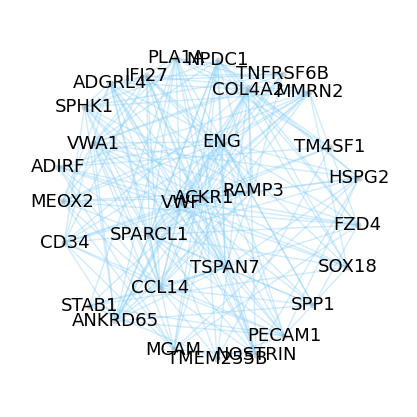

In [11]:
# Visualize the subnetwork of program M1 (top 30 genes by degree/connectivity for readability).
ggm.module_network_plot(module_id = 'M1', seed = 1) 
# Fix layout randomness for reproducibility via set seed.

In [12]:
# Gene Ontology (GO) enrichment analysis with BH FDR control and p-value threshold 0.05.
# sg.download_go_annotations(species = 'human', outdir = 'data/go_annotations')
ggm.go_enrichment_analysis(species = 'human', padjust_method = "BH", pvalue_cutoff = 0.05)



Reading GO term information for |human|...

Start GO enrichment analysis ...
Found 174 significant enriched GO terms in M26       
GO enrichment analysis completed. Found 3019 significant enriched GO terms total.


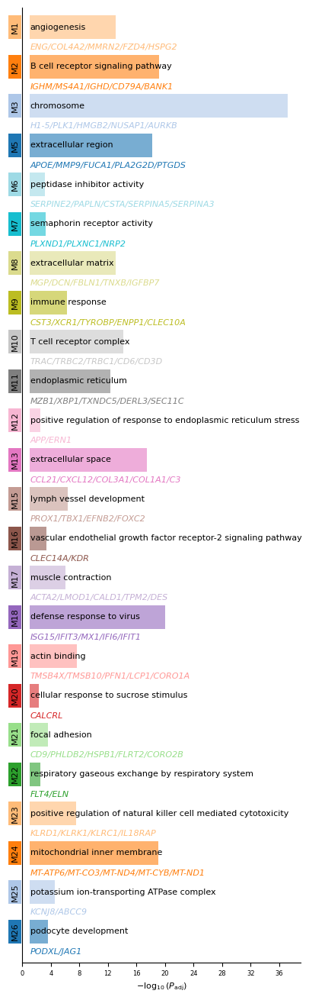

In [13]:
# Visualize top enriched GO terms for all identified programs.
ggm.module_go_enrichment_plot(shown_modules = ggm.modules_summary['module_id'].tolist(), go_per_module = 1,
                              fig_width = 4.5)


module_id                      M1
module_size                   175
go_rank                         1
go_id                  GO:0001525
go_category    biological_process
go_term              angiogenesis
Name: 0, dtype: object


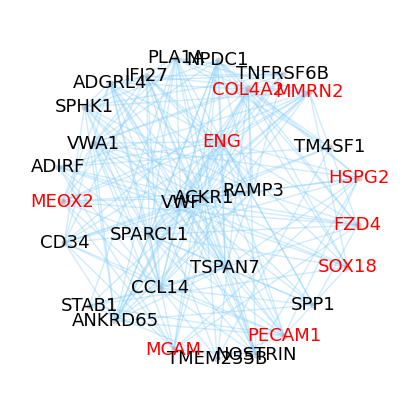

module_id                      M1
module_size                   175
go_rank                         2
go_id                  GO:0007155
go_category    biological_process
go_term             cell adhesion
Name: 1, dtype: object


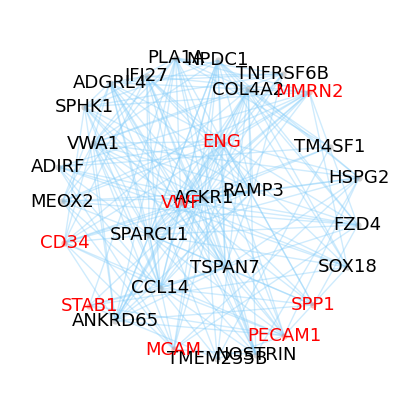

In [14]:
# Visualize the M1 network with nodes highlighted by a selected GO or MP term.
print(ggm.go_enrichment.iloc[0, :6])
ggm.module_network_plot(module_id = 'M1', highlight_anno = "angiogenesis", seed = 1)
print(ggm.go_enrichment.iloc[1, :6])
ggm.module_network_plot(module_id = 'M1', highlight_anno = "cell adhesion", seed = 1)


In [15]:
# Print a summary of the GGM analysis.
print(ggm)


View of ggm object: Human Lymph Node
MetaInfo:
  Gene Number: 18038
  Sample Number: 35909
  Pcor Threshold: 0.027

Results:
  SigEdges: DataFrame with 7749 significant gene pairs
  modules: 26 modules with 1427 genes
  modules_summary: DataFrame with 26 rows
  FDR: Exists



In [16]:
# Save the GGM object to HDF5 for later reuse.
sg.save_ggm(ggm, "data/Human_Lymph_Node_HD.ggm.h5")


 ### Part 2: Spot annotation based on program expression ###

In [17]:
# Compute per-spot expression scores of each gene program.
sg.calculate_module_expression(adata, ggm)



Calculating module expression using top 30 genes...

Calculating gene weights based on degree...
Storing module information in adata.uns['module_info']...

Assigning colors to 26 modules...

Total 26 modules' average expression calculated and stored in adata.obs and adata.obsm


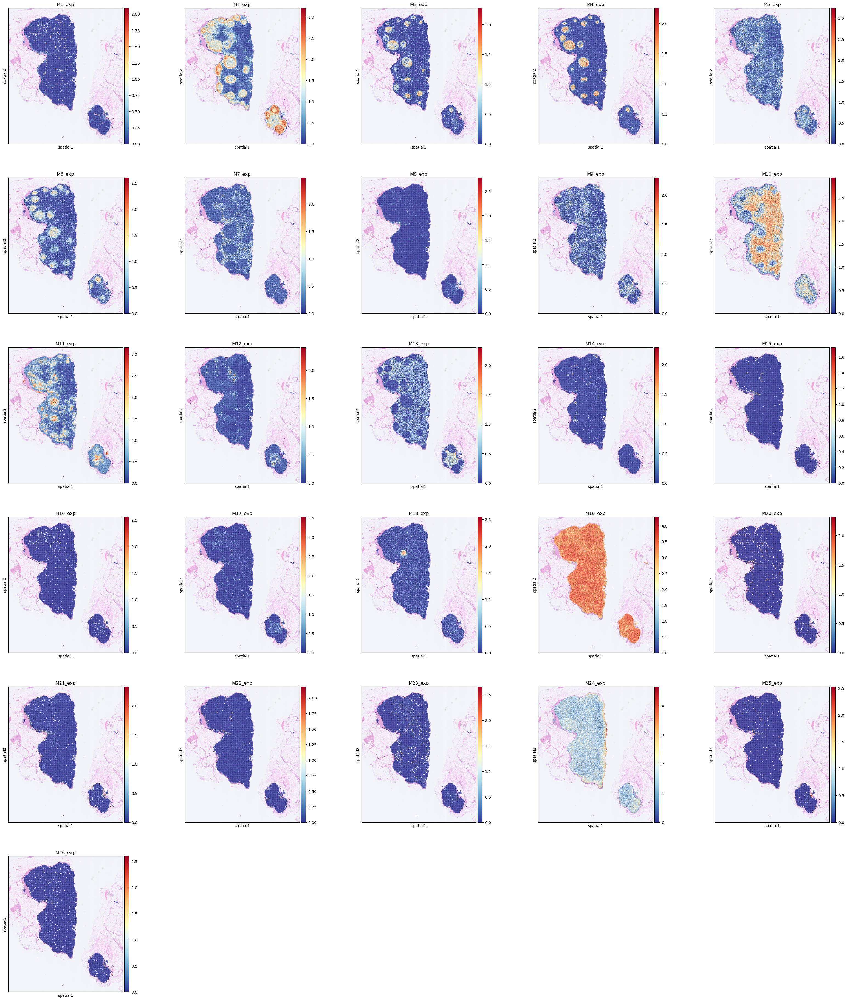

In [18]:
# Visualize the spatial distribution of the top 20 program-expression scores.
plt.rcParams["figure.figsize"] = (7, 7)
program_list = ggm.modules_summary['module_id'] + '_exp'
sc.pl.spatial(adata, size = 1.2, alpha_img = 0.5, color = program_list, cmap = 'RdYlBu_r', ncols = 5)


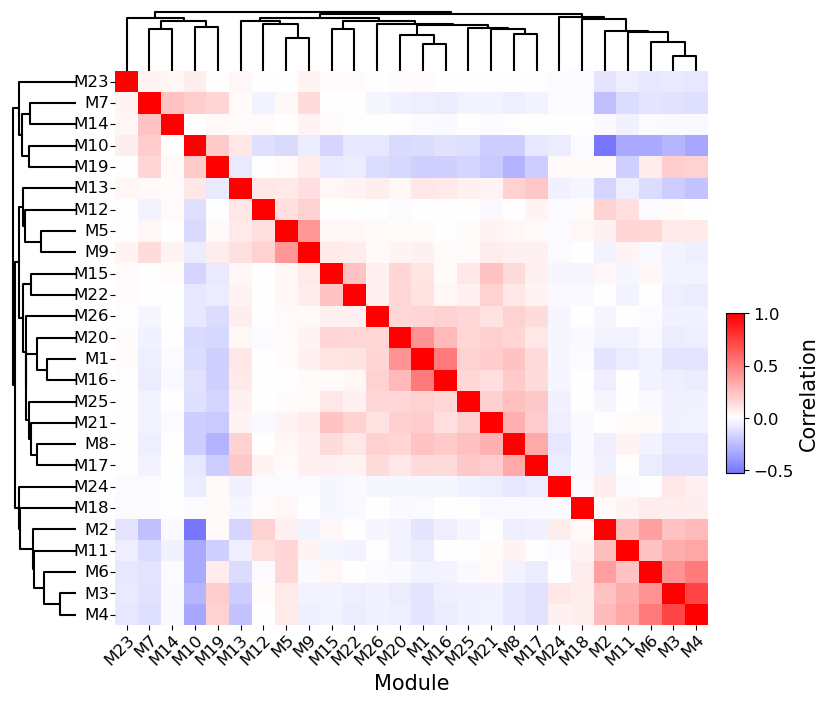

In [19]:
# Compute pairwise program similarity and plot the correlation heatmap with dendrograms.
sg.module_similarity_plot(adata, ggm_key = 'ggm', corr_method = 'pearson', heatmap_metric = 'correlation', 
                          fig_height = 8, fig_width = 9, dendrogram_height = 0.1, dendrogram_space = 0.12, return_summary = False)


In [20]:
# Assign spot-level annotations via Gaussian Mixture Models (GMMs) based on program expression.
sg.calculate_gmm_annotations(adata, ggm_key = 'ggm')


M1 processed successfully, annotated cells: 2995
M2 processed successfully, annotated cells: 16627
M3 processed successfully, annotated cells: 7665
M4 processed successfully, annotated cells: 5666
M5 processed successfully, annotated cells: 3212
M6 processed successfully, annotated cells: 12555
M7 processed successfully, annotated cells: 3493
M8 processed successfully, annotated cells: 1218
M9 processed successfully, annotated cells: 15182
M10 processed successfully, annotated cells: 493
M11 processed successfully, annotated cells: 3272
M12 processed successfully, annotated cells: 1166
M13 processed successfully, annotated cells: 11844
M14 processed successfully, annotated cells: 1650
M15 processed successfully, annotated cells: 807
M16 processed successfully, annotated cells: 1601
M17 processed successfully, annotated cells: 686
M18 processed successfully, annotated cells: 7711
M19 processed, failed: no_positive_cells
M20 processed successfully, annotated cells: 1974
M21 processed suc

In [21]:
# Optionally smooth the annotations using spatial k-NN (on the 'spatial' embedding).
sg.smooth_annotations(adata, ggm_key = 'ggm', embedding_key = 'spatial', k_neighbors = 24)


M1 processed. remain cells: 2854
M2 processed. remain cells: 18957
M3 processed. remain cells: 8298
M4 processed. remain cells: 5735
M5 processed. remain cells: 3021
M6 processed. remain cells: 14584
M7 processed. remain cells: 3558
M8 processed. remain cells: 1041
M9 processed. remain cells: 20372
M10 processed. remain cells: 317
M11 processed. remain cells: 3558
M12 processed. remain cells: 1143
M13 processed. remain cells: 15854
M14 processed. remain cells: 1286
M15 processed. remain cells: 696
M16 processed. remain cells: 1352
M17 processed. remain cells: 520
M18 processed. remain cells: 7874
M19 processed. remain cells: 0
M20 processed. remain cells: 1668
M21 processed. remain cells: 3259
M22 processed. remain cells: 1008
M23 processed. remain cells: 821
M24 processed. remain cells: 91
M25 processed. remain cells: 668
M26 processed. remain cells: 1426

Annotation smoothing completed. Results stored in adata.obs.



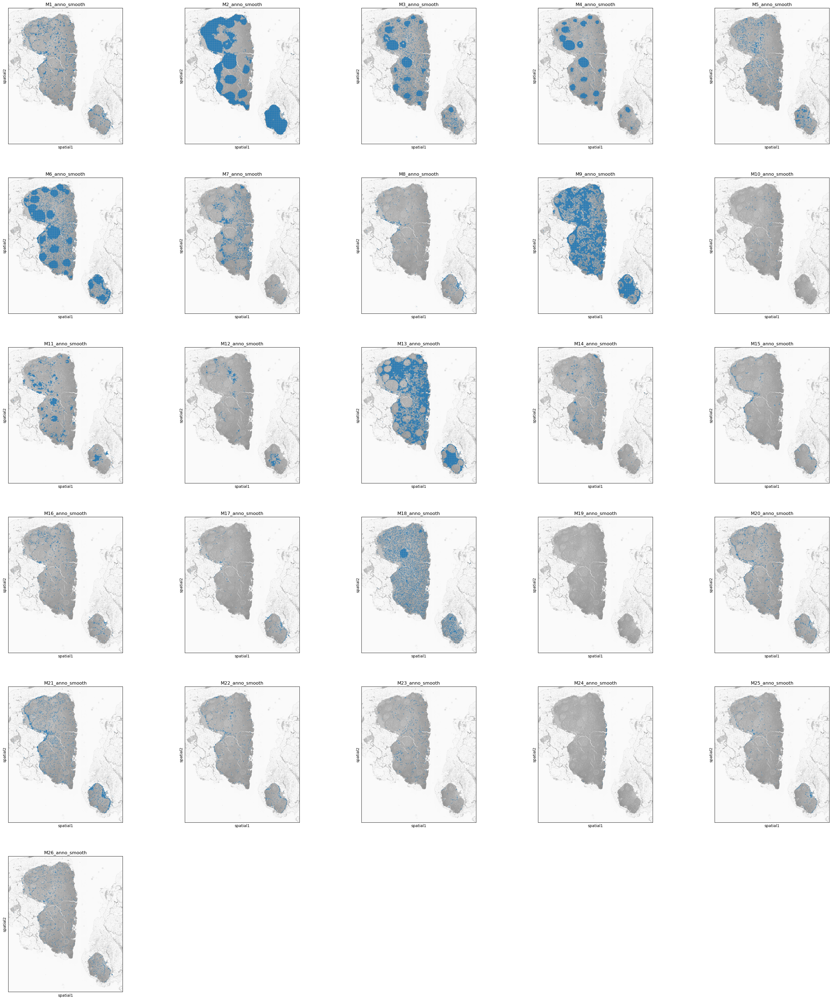

In [22]:
# Display smoothed annotations for the top 20 programs.
# If smoothing is skipped, use 'M1_anno' … 'M20_anno' instead.
plt.rcParams["figure.figsize"] = (7, 7)
program_list = ggm.modules_summary['module_id'] + '_anno_smooth'
sc.pl.spatial(adata, size = 1.2, alpha_img = 0.5, bw = True, color = program_list, legend_loc = None, ncols = 5)
# Where the blue nodes indicate the spots annotated by the program, and gray nodes are unassigned.


In [23]:
# Integrate multiple program-derived annotations into a single label set via sg.integrate_annotations.
sg.integrate_annotations(adata, ggm_key = 'ggm', result_anno = 'ggm_annotation')
# Here we integrate all programs as an example. You can specify a subset of programs via the 'modules_used' parameter.



Calculating 24 nearest neighbors for each cell based on spatial embedding...


29821 of total 35909 cells have multiple annotations. Among them, 
    10316 cells are resolved by neighbors.
    19505 cells are resolved by expression score.

Integrated annotation stored in adata.obs['ggm_annotation'].



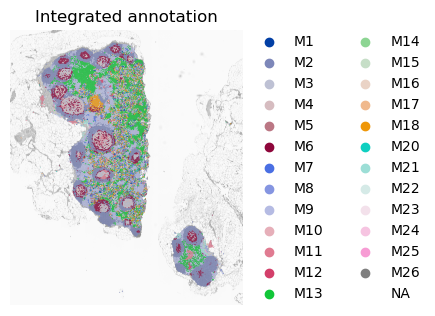

In [24]:
# Visualize the integrated annotation.
plt.rcParams["figure.figsize"] = (3, 6)
sc.pl.spatial(adata, size = 1.2, alpha_img = 0.5, bw = True, color = ['ggm_annotation'], frameon = False, title = 'Integrated annotation')


 ### Part 3: Cluster spots based a dimensionality reduction of program expression ###

In [25]:
# Build a neighborhood graph based on program expression and perform clustering.
sc.pp.neighbors(adata, 
                use_rep='module_expression_scaled',
                n_pcs=adata.obsm['module_expression_scaled'].shape[1])
sc.tl.leiden(adata, resolution=1, key_added='leiden_ggm')
sc.tl.louvain(adata, resolution=1, key_added='louvan_ggm')


/home/ypxu/anaconda3/envs/SpacGPA/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


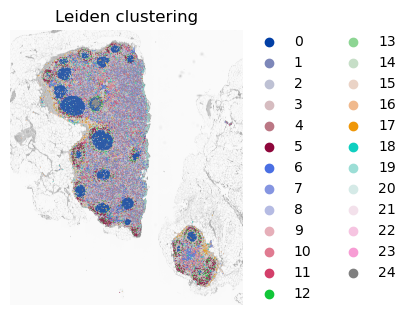

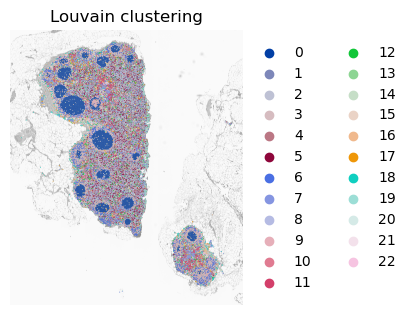

In [26]:
# Visualize the clustering results.
plt.rcParams["figure.figsize"] = (3, 6)
sc.pl.spatial(adata, size = 1.2, alpha_img = 0.5, bw = True, color = ['leiden_ggm'], frameon = False, title = 'Leiden clustering')
plt.rcParams["figure.figsize"] = (3, 6)
sc.pl.spatial(adata, size = 1.2, alpha_img = 0.5, bw = True, color = ['louvan_ggm'], frameon = False, title = 'Louvain clustering')


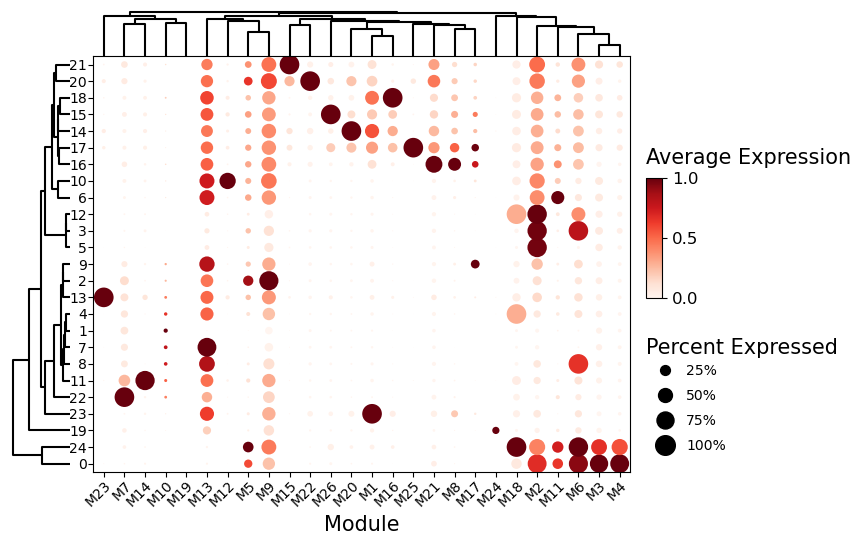

In [27]:
# Summarize program-expression across the leiden clusters clusters as a dot plot.
sg.module_dot_plot(adata, ggm_key = 'ggm', groupby = 'leiden_ggm', scale=True,
                   dendrogram_height = 0.1, dendrogram_space = 0.08, fig_height=6, fig_width = 8, axis_fontsize = 10)


In [28]:
# Save the annotated AnnData object.
adata.write("data/Human_Lymph_Node_HD_ggm_anno.h5ad")
